<!-- PLANET NOTEBOOK METADATA
Source URL: https://github.com/planetlabs/notebooks/blob/master/jupyter-notebooks/workflows/introduction_to_analysis_apis/introduction_to_analysis_apis.ipynb
Planet Product: PlanetScope
Use Case: Introduction To Analysis Apis
Description: Demonstrates how to access and analyze satellite imagery from Sentinel-2, Planetscope, and Planet Fusion using the Sentinel Hub Python client library's Catalog, Process, and Statistical APIs for tasks like discovery, visualization (including NDVI), and time-series analysis.
-->

<img src="https://upload.wikimedia.org/wikipedia/commons/f/f3/Planet_Labs_logo.svg" alt="Drawing" style="width: 200px;"/>

# First Steps in accessing Satellite Imagery with Sentinel Hub APIs

The Sentinel Hub API is a RESTful API interface that provides access to various satellite imagery archives. It allows you to access raw satellite data, rendered images, statistical analysis, and other features. In this notebook we will explore the basic functionalities of the core Sentinel Hub APIs.

In this notebook, we will learn how to:
- Search and discover free and open data using Catalog API.
- How to quickly access satellite imagery (Sentinel-2 and Planetscope) though Sentinel Hub using Process API.
- Rewrite our evalscript to visualise NDVI using Process API. 
- Use Statistical API to produce NDVI time series for single and multiple fields with Sentinel-2 L2A and Planet Fusion.

For this course, it is assumed that you will already have some prior experience with Python and its basic data science and visualisation libraries such as `pandas`, `matplotlib` and `numpy`. In this notebook we will also make use of the [Sentinel Hub Python library](https://sentinelhub-py.readthedocs.io/en/latest/index.html). To install this Python library, in your Terminal you can use the following command: `pip install sentinelhub`. For more information, you can check the docs [here](https://sentinelhub-py.readthedocs.io/en/latest/install.html).

Firstly, let's import the notebook dependencies, followed by some utility functions that we will use to help us visualise the data later on in the notebook:

In [1]:
# Utilities
import os
import matplotlib.pyplot as plt
import pandas as pd
import geopandas
from typing import Any, Optional, Tuple
import numpy as np
import getpass
import warnings
import getpass
warnings.filterwarnings('ignore')

from sentinelhub import (
    SHConfig,
    DataCollection,
    SentinelHubCatalog,
    SentinelHubRequest,
    SentinelHubStatistical,
    SentinelHubStatisticalDownloadClient,
    BBox,
    bbox_to_dimensions,
    CRS,
    MimeType,
    Geometry,
    parse_time
)

In [2]:
# Helper Utility Functions

def plot_image(
    image: np.ndarray,
    factor: float = 1.0,
    clip_range: Optional[Tuple[float, float]] = None,
    **kwargs: Any
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

# define functions to extract statistics for all acquisition dates
def extract_stats(date, stat_data):
    d = {}
    for key, value in stat_data['outputs'].items():
        stats = value['bands']['B0']['stats']
        if stats['sampleCount']==stats['noDataCount']:
            continue
        else:
            d['date'] = [date]
            for stat_name, stat_value in stats.items():
                if (stat_name=='sampleCount' or stat_name=='noDataCount'):
                    continue
                else:
                    d[f'{key}_{stat_name}'] = [stat_value]
    return pd.DataFrame(d)

def read_acquisitions_stats(stat_data):
    df_li = []
    for aq in stat_data:
        date = aq['interval']['from'][:10]
        df_li.append(extract_stats(date, aq))
    return pd.concat(df_li)

def stats_to_df(stats_data):
    """Transform Statistical API response into a pandas.DataFrame"""
    df_data = []

    for single_data in stats_data["data"]:
        df_entry = {}
        is_valid_entry = True

        df_entry["interval_from"] = parse_time(single_data["interval"]["from"]).date()
        df_entry["interval_to"] = parse_time(single_data["interval"]["to"]).date()

        for output_name, output_data in single_data["outputs"].items():
            for band_name, band_values in output_data["bands"].items():
                band_stats = band_values["stats"]
                if band_stats["sampleCount"] == band_stats["noDataCount"]:
                    is_valid_entry = False
                    break

                for stat_name, value in band_stats.items():
                    col_name = f"{output_name}_{band_name}_{stat_name}"
                    if stat_name == "percentiles":
                        for perc, perc_val in value.items():
                            perc_col_name = f"{col_name}_{perc}"
                            df_entry[perc_col_name] = perc_val
                    else:
                        df_entry[col_name] = value

        if is_valid_entry:
            df_data.append(df_entry)

    return pd.DataFrame(df_data)

## Credentials

Credentials for Sentinel Hub services (client_id & client_secret) can be obtained in your [Dashboard](https://apps.sentinel-hub.com/dashboard/#/). In the User Settings you can create a new OAuth Client to generate these credentials. For more detailed instructions, visit the relevant documentation page.

Now that you have your `client_id` & `client_secret`, it is recommended to configure a new profile in your Sentinel Hub Python package. Instructions on how to configure your Sentinel Hub Python package can be found [here](https://sentinelhub-py.readthedocs.io/en/latest/configure.html). This is useful as changes to the the `config` class are usually only temporary in your notebook and by saving the configuration to your profile you won't need to generate new credentials or overwrite/change the default profile each time you rerun or write a new Jupyter Notebook.

If you are a first time user of the Sentinel Hub Python package, you should create a profile so you don't need to create new credentials each time you open up Jupyter Lab. You can do this in the following cell:

In [3]:
config = SHConfig()

if not config.sh_client_id or not config.sh_client_secret:
    print("No credentials found, please provide the OAuth client ID and secret.")
    config.sh_client_id = getpass.getpass("sh_client_id: ")
    config.sh_client_secret = getpass.getpass("sh_client_secret: ")
    config.save()
    print(f"Credentials saved to {SHConfig.get_config_location()}")
else:
    print(f"Using credentials stored here: {SHConfig.get_config_location()}")

Using credentials stored here: C:\Users\username\.config\sentinelhub\config.toml


## Setting an area of interest

Firstly, we need to define our area of interest. For this example, we will use an area of interest south of Berlin. We define it as a `geojson` string in the below cells. If you wish you can try putting in your own area of interest. It intersects the Brandenberg AOI, part of the [Analysis-Ready-Planetscope Sandbox Data](https://docs.planet.com/data/imagery/arps/sandbox/) made available through as part of the Planet Sandbox Data. 

In [4]:
aoi_geojson = """{"type":"Polygon","coordinates":[[[13.647319424391469,52.41447863226527],[13.653878879750994,52.198766804010276],[13.30286649383256,52.194239593369225],[13.294598412685017,52.40991628276371],[13.647319424391469,52.41447863226527]]]}"""

We can then visualise the AOI using `geopandas`:

In [ ]:
aoi = geopandas.read_file(aoi_geojson)
aoi["area"] = aoi.area
aoi.explore("area", color="Green", legend=False)

## Catalog API
To search and discover data, you can use the Catalog API. Sentinel Hub Catalog API (or shortly "Catalog") is an API implementing the STAC Specification, providing geospatial information for data available in Sentinel Hub. Firstly, to initialise the `SentinelHubCatalog` class we will use:

In [6]:
catalog = SentinelHubCatalog(config=config)

Now we can build the Catalog API request; to do this we use the `aoi_bbox` we defined earlier as well as `time_interval` and insert these into the request:

In [7]:
time_interval = "2022-05-01", "2022-05-20"
geometry = Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84)

search_iterator = catalog.search(
    DataCollection.SENTINEL2_L2A,
    geometry=geometry,
    time=time_interval,
    fields={"include": ["id", "properties.datetime"], "exclude": []},
)

results = list(search_iterator)
print("Total number of results:", len(results))

results

Total number of results: 54


[{'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T32UQC_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:34Z'}},
 {'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T33UUT_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:33Z'}},
 {'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T33UVT_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:28Z'}},
 {'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T32UQD_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:19Z'}},
 {'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T33UUU_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:18Z'}},
 {'id': 'S2A_MSIL2A_20220518T100601_N0400_R022_T33UVU_20220518T162816',
  'properties': {'datetime': '2022-05-18T10:16:14Z'}},
 {'id': 'S2B_MSIL2A_20220516T101559_N0400_R065_T32UQC_20220722T190205',
  'properties': {'datetime': '2022-05-16T10:26:24Z'}},
 {'id': 'S2B_MSIL2A_20220516T101559_N0400_R065_T32UQC_20220516T133430',
  'properties': {'datetime': '2022-05-1

## Process API

### Example 1: True Color Image

We build the request according to the [API Reference](https://docs.sentinel-hub.com/api/latest/), using the `SentinelHubRequest` class. Each Process API request also needs an [evalscript](https://docs.sentinel-hub.com/api/latest/evalscript/). An evalscript (or "custom script") is a piece of Javascript code which defines how the satellite data shall be processed by Sentinel Hub and what values the service shall return. It is a required part of any [process](https://docs.sentinel-hub.com/api/latest/api/process/), [batch processing](https://docs.sentinel-hub.com/api/latest/api/batch/) or [OGC request](https://docs.sentinel-hub.com/api/latest/api/ogc/).

The information that we specify in the `SentinelHubRequest` object is:
- an evalscript,
- a list of input data collections with time interval,
- a format of the response,
- a bounding box and its size (size or resolution).
- `mosaickingOrder` (optional): in this example we have used `leastCC` which will return pixels from the least cloudy acquisition in the specified time period.

The evalscript in the example is used to select the appropriate bands. We return the RGB (B04, B03, B02) Sentinel-2 L2A bands.

The least cloudy image from the time period is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in `UINT8` format (values in 0-255 range).

In [8]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2022-06-01", "2022-06-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},)
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [9]:
true_color_imgs = request_true_color.get_data()

In [10]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 3)


Image type: uint8


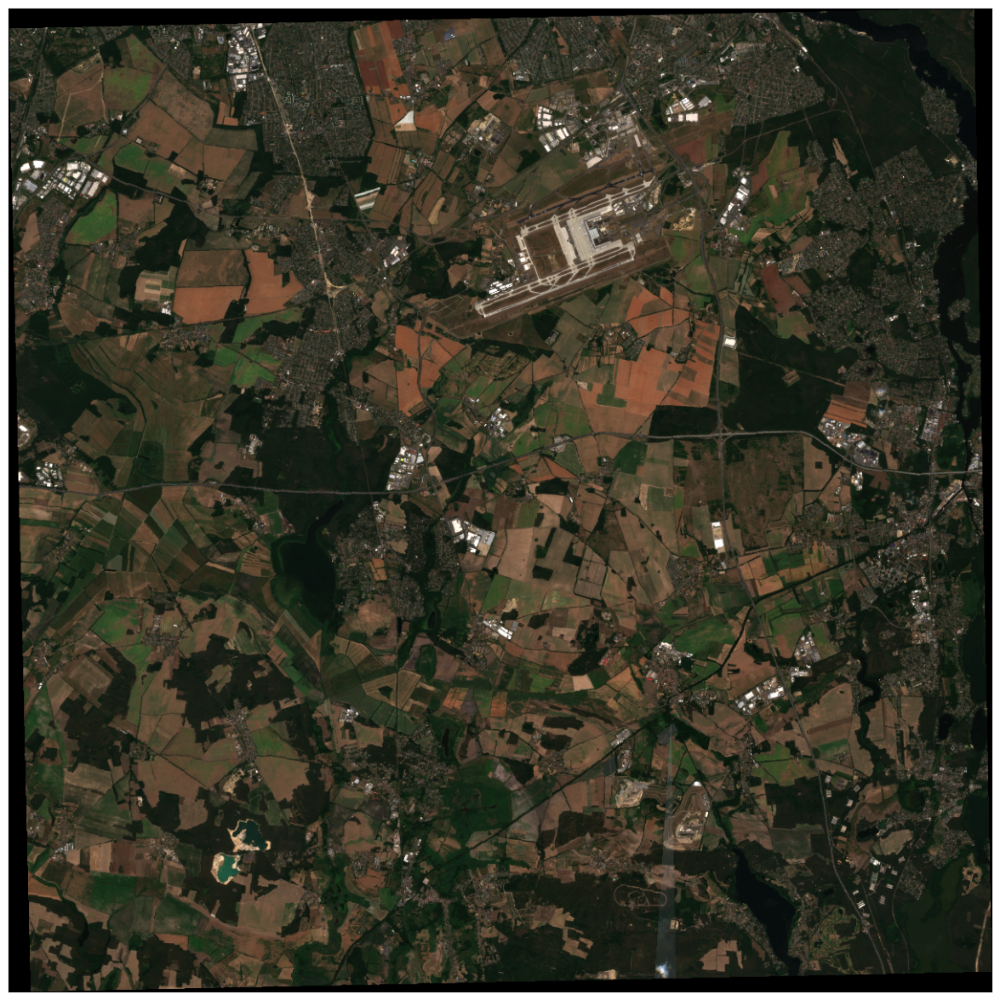

In [11]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=2.5 / 255, clip_range=(0, 1))

### Example 2: NDVI Image

Secondly, we will also show you an example of how to calculate and visualise NDVI using the same API. NDVI is a very commonly used spectral vegetation index for vegetation monitoring, for example, monitoring crop growth and yields. As you will notice in the codeblock below, the evalscript has changed substantially:
- we are only using Band 4 and Band 8 as an input into our script.
- In the `evaluatePixel()` function, we calculate NDVI and visualise this using the `imgVals` array. 

In [12]:
evalscript_ndvi = """
//VERSION=3
function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}
  

function evaluatePixel(sample) {
    let val = (sample.B08 - sample.B04) / (sample.B08 + sample.B04);
    let imgVals = null;
    
    if (val<-1.1) imgVals = [0,0,0];
    else if (val<-0.2) imgVals = [0.75,0.75,0.75];
    else if (val<-0.1) imgVals = [0.86,0.86,0.86];
    else if (val<0) imgVals = [1,1,0.88];
    else if (val<0.025) imgVals = [1,0.98,0.8];
    else if (val<0.05) imgVals = [0.93,0.91,0.71];
    else if (val<0.075) imgVals = [0.87,0.85,0.61];
    else if (val<0.1) imgVals = [0.8,0.78,0.51];
    else if (val<0.125) imgVals = [0.74,0.72,0.42];
    else if (val<0.15) imgVals = [0.69,0.76,0.38];
    else if (val<0.175) imgVals = [0.64,0.8,0.35];
    else if (val<0.2) imgVals = [0.57,0.75,0.32];
    else if (val<0.25) imgVals = [0.5,0.7,0.28];
    else if (val<0.3) imgVals = [0.44,0.64,0.25];
    else if (val<0.35) imgVals = [0.38,0.59,0.21];
    else if (val<0.4) imgVals = [0.31,0.54,0.18];
    else if (val<0.45) imgVals = [0.25,0.49,0.14];
    else if (val<0.5) imgVals = [0.19,0.43,0.11];
    else if (val<0.55) imgVals = [0.13,0.38,0.07];
    else if (val<0.6) imgVals = [0.06,0.33,0.04];
    else imgVals = [0,0.27,0];
    
    
    imgVals.push(sample.dataMask)
    
    return imgVals
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2022-06-01", "2022-06-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

The same method as before is used to request and then visualise the data. In the visualisation, the darker greens indicate a higher NDVI value (vegetation, forest) and the lighter greens (urban areas and water bodies) represent areas with lower NDVI values.

In [13]:
ndvi_img = request_ndvi_img.get_data()

In [14]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 3)


Image type: uint8


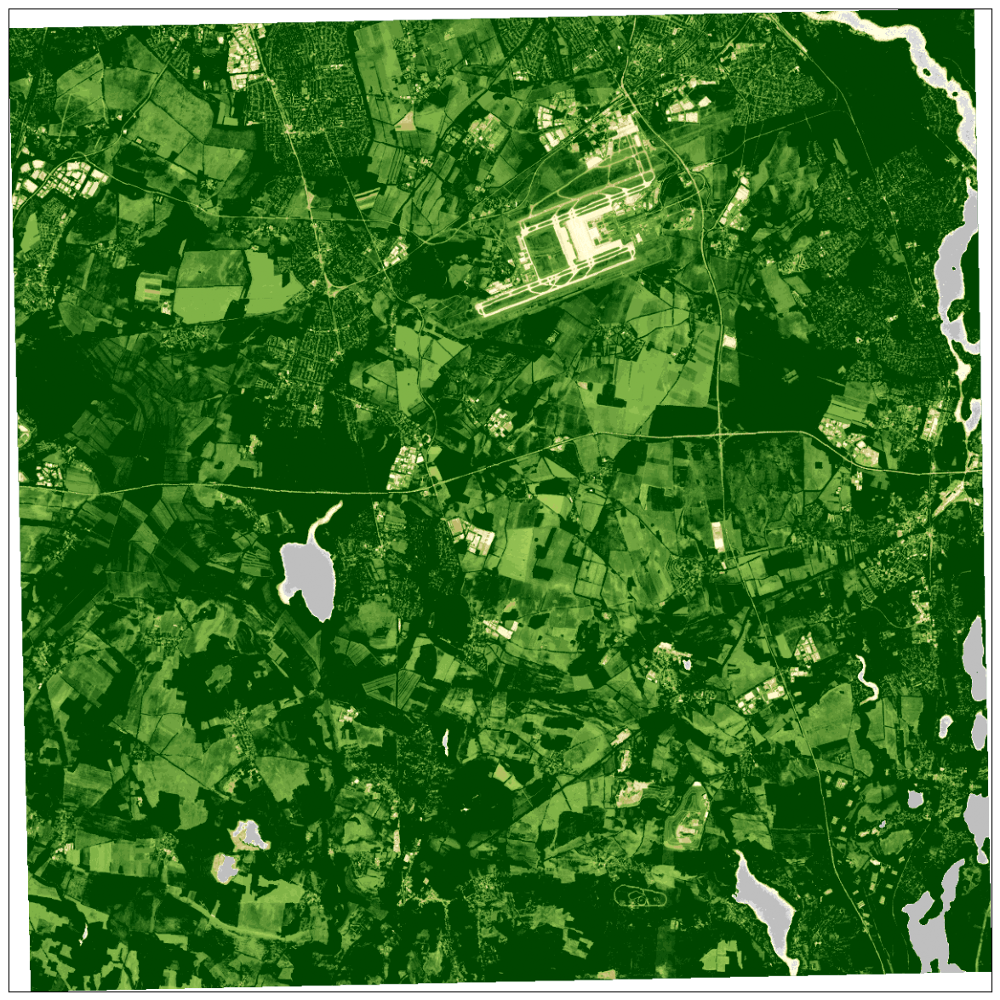

In [15]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
plot_image(image, factor=1 / 255)

## Doing the same with Planet data

In this example, we will show how you can make a Process API request, but this time visualising a TrueColor image derived from Analysis-Ready PlanetScope data. 

In [16]:
evalscript_true_color = """
//VERSION=3

function setup() {
    return {
        input: [{
            bands: ["blue", "green", "red", "dataMask"],
        }],
        output: {
            bands: 4
        }
    };
}

let factor = 1/2000;
function evaluatePixel(sample) {
    return [
        factor * sample.red,
        factor * sample.green,
        factor * sample.blue,
        sample.dataMask

];
}
"""
request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2022-06-21", "2022-06-21"),            
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

In [17]:
true_color_imgs = request_true_color.get_data()

In [18]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 4)


Image type: uint8


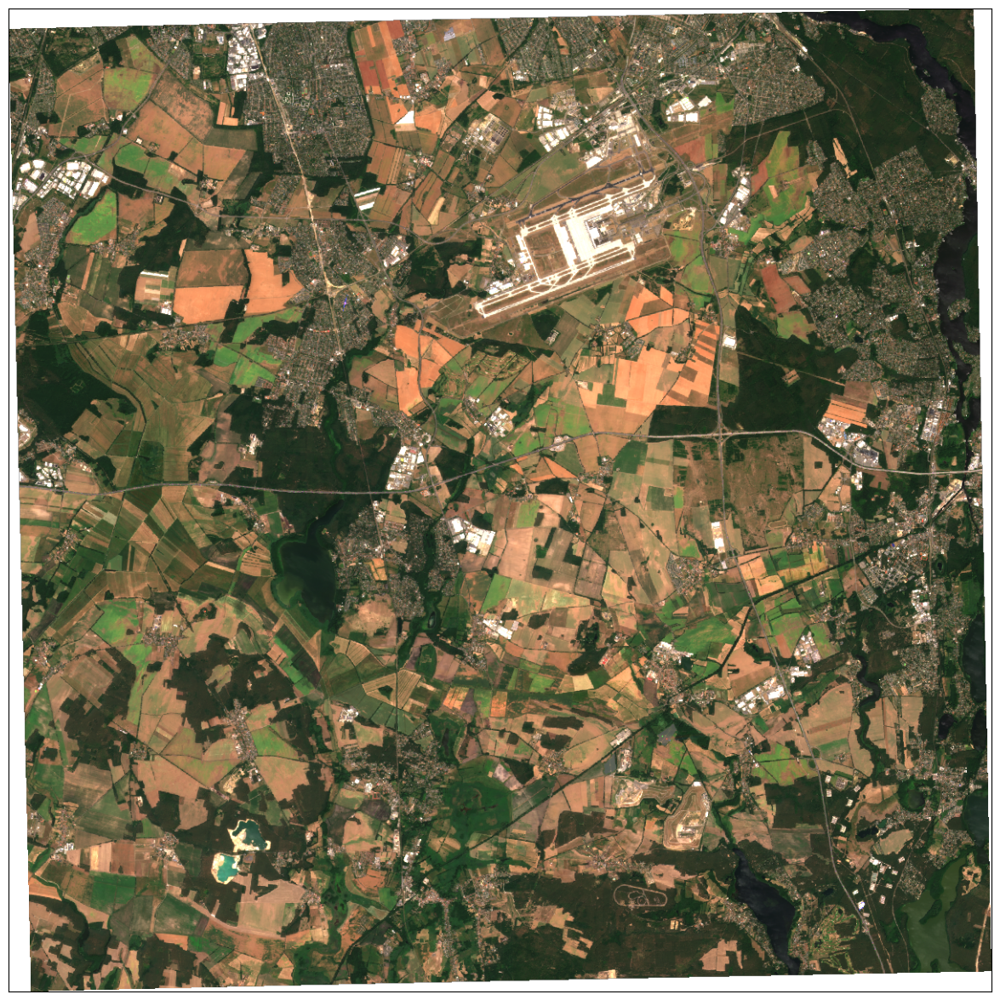

In [19]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=1 / 255, clip_range=(0, 1))

## How to download your PlanetScope image at specific resolutions?

In this request, we specify a resolution instead of the image size in pixels. You can see the resolution is defined as `resolution=[0.00005,0.00005]` In this example, the native projection used is WGS84 so the units used are in degrees corresponding to approximately 5mx5m per pixel. If your AOI and output was projected in UTM, then you would use metres as your unit of measurement.

In [ ]:
download_true_color = SentinelHubRequest(
    data_folder="planet_downloads",
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2022-06-21", "2022-06-21"),
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    resolution=[0.00005,0.00005],
    config=config,
)

In this second cell, instead of displaying the data, we actually save it to file. This can then be used with a GIS (ArcGIS or QGIS) for further analysis. 

In [21]:
download = download_true_color.get_data(save_data=True)
download

DownloadFailedException: Failed to download from:
https://services.sentinel-hub.com/api/v1/process
with HTTPError:
400 Client Error: Bad Request for url: https://services.sentinel-hub.com/api/v1/process
Server response: "{"status": 400, "reason": "Bad Request", "message": "`width = 7186`, calculated from resx, is larger than allowed 2500.\n`height = 4405`, calculated from resy, is larger than allowed 2500.\n", "code": "COMMON_BAD_PAYLOAD", "errors": [{"parameter": "output->resx", "violation": "`width = 7186`, calculated from resx, is larger than allowed 2500."}, {"parameter": "output->resy", "violation": "`height = 4405`, calculated from resy, is larger than allowed 2500."}]}"

Whoops! We have encountered an error! If we read into this we can see that the image we have requested would be 7186x4405 pixels! This is over the limit of 2500x2500 pixels that is set for Process API requests. Therefore, to return a high resolution image we need to reduce the size of our AOI. If you do need to extract larger areas at full resolution, you can look into [Asynchronous Process API](https://docs.sentinel-hub.com/api/latest/api/async-process/) with a maximum image size of 10,000x10,000 pixels or even [Batch Processing API](https://docs.sentinel-hub.com/api/latest/api/batch/). 

In [22]:
smaller_aoi_geojson = """{
  "type": "Polygon",
  "coordinates": [
    [
      [
        13.515353,
        52.336912
      ],
      [
        13.603285,
        52.336912
      ],
      [
        13.603285,
        52.381048
      ],
      [
        13.515353,
        52.381048
      ],
      [
        13.515353,
        52.336912
      ]
    ]
  ]
}"""

Let's visualise the smaller AOI:

In [ ]:
smaller_aoi = geopandas.read_file(smaller_aoi_geojson)
smaller_aoi["area"] = aoi.area
smaller_aoi.explore("area", color="Green", legend=False)

and rerun the request...

In [ ]:
download_true_color = SentinelHubRequest(
    data_folder="planet_downloads",
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2022-06-21", "2022-06-21"),
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=Geometry(geometry=smaller_aoi.geometry.values[0], crs=CRS.WGS84),
    resolution=[0.00005,0.00005],
    config=config,
)

This time the request will work and the image is saved to disk.

In [25]:
download = download_true_color.get_data(save_data=True)
download

[array([[[213, 152, 110, 255],
         [213, 154, 111, 255],
         [215, 155, 111, 255],
         ...,
         [ 26,  57,  26, 255],
         [ 28,  59,  28, 255],
         [ 28,  62,  28, 255]],
 
        [[215, 154, 110, 255],
         [215, 155, 111, 255],
         [217, 155, 111, 255],
         ...,
         [ 33,  58,  31, 255],
         [ 30,  59,  27, 255],
         [ 30,  62,  28, 255]],
 
        [[215, 152, 111, 255],
         [214, 156, 111, 255],
         [213, 153, 111, 255],
         ...,
         [ 31,  61,  33, 255],
         [ 29,  59,  31, 255],
         [ 27,  61,  30, 255]],
 
        ...,
 
        [[103,  93,  63, 255],
         [101,  91,  57, 255],
         [102,  96,  61, 255],
         ...,
         [ 39,  51,  34, 255],
         [ 37,  51,  33, 255],
         [ 34,  49,  32, 255]],
 
        [[106,  98,  65, 255],
         [106, 101,  63, 255],
         [104, 105,  65, 255],
         ...,
         [ 39,  51,  30, 255],
         [ 35,  51,  31, 255],
    

## Statistical API

In the Process API examples, we have seen how to obtain satellite imagery. [Statistical API](https://docs.sentinel-hub.com/api/latest/api/statistical/) can be used in a very similar way. The main difference is that the results of Statistical API are aggregated statistical values of satellite data instead of entire images. In many use cases, such values are all that we need. By using Statistical API we can avoid downloading and processing large amounts of satellite data.

All general rules for building evalscripts apply. However, there are some specifics when using evalscripts with the Statistical API:

- The `evaluatePixel()` function must, in addition to other output, always return a `dataMask` output. This output defines which pixels are excluded from calculations. For more details and an example, see [here](https://docs.sentinel-hub.com/api/latest/api/statistical/#exclude-pixels-from-calculations-datamask-output).
- The default value of sampleType is `FLOAT32`.
- The output.bands parameter in the setup() function can be an array. This makes it possible to specify custom names for the output bands and different output `dataMask` for different outputs, see this [example](https://docs.sentinel-hub.com/api/latest/api/statistical/examples/#multiple-outputs-with-different-datamasks-multi-band-output-with-custom-bands-names-and-different-histogram-types).

In this example, we have chosen a selection of agricultural fields in Ile-de-France. The data collection we are using is the [PlanetScope Sandbox Data Collection](https://docs.planet.com/data/imagery/planetscope/sandbox/).

In [26]:
fields="""{
"type": "FeatureCollection",
"name": "french_fields",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
"features": [
{ "type": "Feature", "properties": { "id": 1 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 3.018730388794967, 48.31900866284024 ], [ 3.02416040226223, 48.319921908340902 ], [ 3.024582971403651, 48.318306155176266 ], [ 3.019491013249525, 48.317392880750582 ], [ 3.018730388794967, 48.31900866284024 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 2 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 3.014150362764628, 48.311958271928731 ], [ 3.012550141917608, 48.312082666515273 ], [ 3.009640649468477, 48.312428205442302 ], [ 3.009328918134642, 48.314653420076148 ], [ 3.015334941833203, 48.314529031756756 ], [ 3.015272595566436, 48.314072938657887 ], [ 3.01566745525596, 48.313603020291822 ], [ 3.016311700012554, 48.313091633623024 ], [ 3.016914380591302, 48.312911956009131 ], [ 3.017142983569447, 48.312566420357946 ], [ 3.016789688057767, 48.312372919371228 ], [ 3.015064774677212, 48.312013558449088 ], [ 3.014150362764628, 48.311958271928731 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 3 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 3.018867896950004, 48.310686665428022 ], [ 3.016685777613156, 48.30872390623729 ], [ 3.013339861296657, 48.311115145071334 ], [ 3.014025670231094, 48.311875342035918 ], [ 3.015542762722426, 48.311972093564449 ], [ 3.016290917923631, 48.311225719879126 ], [ 3.017371586547594, 48.311502155850299 ], [ 3.018285998460177, 48.310838707003604 ], [ 3.018867896950004, 48.310686665428022 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 4 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 2.991995616868946, 48.313513412817962 ], [ 2.996665005881652, 48.314890448089699 ], [ 2.997045318108931, 48.314595372231501 ], [ 2.997953841762987, 48.314258140589665 ], [ 2.998756723131687, 48.313710134417846 ], [ 2.993073168179571, 48.312094184517214 ], [ 2.991995616868946, 48.313513412817962 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 5 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 3.005412187109072, 48.316379852565653 ], [ 3.005496700937356, 48.313583670619266 ], [ 3.003341598316108, 48.314412705368852 ], [ 3.002242918548413, 48.314763987216573 ], [ 3.001313266437286, 48.314862345700547 ], [ 3.000785055010509, 48.315059062099621 ], [ 3.004165608141879, 48.315958327408346 ], [ 3.005412187109072, 48.316379852565653 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 6 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 2.994681699890837, 48.308712715603669 ], [ 2.994697906481011, 48.308691157048038 ], [ 2.994924798743444, 48.308259984022804 ], [ 2.994973418513966, 48.307559320087115 ], [ 2.991083836872255, 48.307483863397216 ], [ 2.990630052347389, 48.30864803990945 ], [ 2.994681699890837, 48.308712715603669 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 7 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 3.001245368911225, 48.311019428435152 ], [ 2.994519633989099, 48.308971417560947 ], [ 2.993352759496587, 48.310577496200999 ], [ 3.000175733959753, 48.312539214953759 ], [ 3.000775377796184, 48.31147213553583 ], [ 3.001002270058617, 48.311213446255813 ], [ 3.001245368911225, 48.311019428435152 ] ] ] ] } }
]
}
"""

In [ ]:
fields_gdf = geopandas.read_file(fields)

#fields_gdf
fields_gdf["area"] = fields_gdf.area
fields_gdf.explore("area", cmap="tab10", legend=False)

### Requesting, and plotting an NDVI time series for a single field

In the example here, we will calculate NDVI for a specific field of interest and then plot the mean NDVI and standard deviation over the requested time period. First we define our evalscript:

In [28]:
evalscript = """
//VERSION=3
//NDVI

function setup() {
  return {
    input: [{
      bands: [
        "red",
        "nir",
        "dataMask",
        "clear"
      ]
    }],
    output: [
      { id: "index", bands: 1, sampleType: "FLOAT32" },
      { id: "dataMask", bands: 1 },
    ]
  }
}

function evaluatePixel(samples) {
  let ndvi = (samples.nir - samples.red) / (samples.nir + samples.red);
  const indexVal = samples.dataMask === 1 ? ndvi : NaN;
  const clear = samples.dataMask * samples.clear;
  

  return {
    index: [indexVal],
    dataMask: [clear],
  };
}
"""

In this example, we will plot a time series for a single field within the area we requested using Process API:

Now we have defined the evalscript and the two fields of interest, we can build the first Statistical API Request, before returning the response for the first field. In this request, as part of the payload we define some input parameters:
- `time_interval` this defines the time range of our request.
- `aggregation_interval` this defines the length of time each interval is. In this case, the interval is 10 days. he aggregation intervals should be at least one day long (e.g. "P5D", "P30D"). You can only use period OR time designator not both. 

**NOTE:**
If a timeRange is not divisible by an aggregationInterval, the last ("not full") time interval will be dismissed by default (SKIP option). The user can instead set the lastIntervalBehavior to SHORTEN (shortens the last interval so that it ends at the end of the provided time range) or EXTEND (extends the last interval over the end of the provided time range so that all the intervals are of equal duration).

In [29]:
fields_gdf = geopandas.read_file(fields)

field1 = fields_gdf.geometry.values[4]

geometry = Geometry(geometry=field1, crs=CRS.WGS84)

request = SentinelHubStatistical(
    aggregation=SentinelHubStatistical.aggregation(
        evalscript=evalscript,
        time_interval=('2022-05-01T00:00:00Z', '2023-04-29T23:59:59Z'),
        aggregation_interval='P5D',
        size=[1500,1050],        
    ),
    input_data=[
        SentinelHubStatistical.input_data(
            data_collection=DataCollection.define_byoc('28eef896-9632-4546-a99e-cea34d74b21e'),
      ),
    ],
    geometry=geometry,
    config=config
)

response1 = request.get_data()
response1

[{'data': [{'interval': {'from': '2022-05-01T00:00:00Z',
     'to': '2022-05-06T00:00:00Z'},
    'outputs': {'index': {'bands': {'B0': {'stats': {'min': 0.22761398553848267,
         'max': 0.723480761051178,
         'mean': 0.3083047343061657,
         'stDev': 0.05753213527022721,
         'sampleCount': 1575000,
         'noDataCount': 857647}}}}}},
   {'interval': {'from': '2022-05-06T00:00:00Z', 'to': '2022-05-11T00:00:00Z'},
    'outputs': {'index': {'bands': {'B0': {'stats': {'min': 0.23369330167770386,
         'max': 0.6750313639640808,
         'mean': 0.32277890058234365,
         'stDev': 0.05033293840743237,
         'sampleCount': 1575000,
         'noDataCount': 857647}}}}}},
   {'interval': {'from': '2022-05-11T00:00:00Z', 'to': '2022-05-16T00:00:00Z'},
    'outputs': {'index': {'bands': {'B0': {'stats': {'min': 'NaN',
         'max': 'NaN',
         'mean': 'NaN',
         'stDev': 'NaN',
         'sampleCount': 1575000,
         'noDataCount': 1575000}}}}}},
   {'int

However, as it is clear to see, our response is not that useful in `json` format. It's difficult to read from a human perspective. So, let's transform it into a `pandas` dataframe. To help us achieve this, let's define some helper functions. 

In [30]:
result_df1 = read_acquisitions_stats(response1[0]['data'])
result_df1

,date,index_min,index_max,index_mean,index_stDev
0,2022-05-01,0.227614,0.723481,0.308305,0.057532
0,2022-05-06,0.233693,0.675031,0.322779,0.050333
0,2022-05-26,0.239186,0.650383,0.324310,0.061672
0,2022-06-05,0.314854,0.837021,0.487735,0.117678
0,2022-06-10,0.339806,0.661533,0.486208,0.060288
0,2022-06-15,0.349004,0.730566,0.581806,0.073820
0,2022-06-25,0.365367,0.817770,0.724944,0.073093
0,2022-06-30,0.349957,0.824909,0.733549,0.063906
0,2022-07-05,0.364534,0.880335,0.796486,0.080333
0,2022-07-10,0.336410,0.591485,0.522882,0.040316


We can take this another step further, and display the data in a time series using the Matplotlib python library:

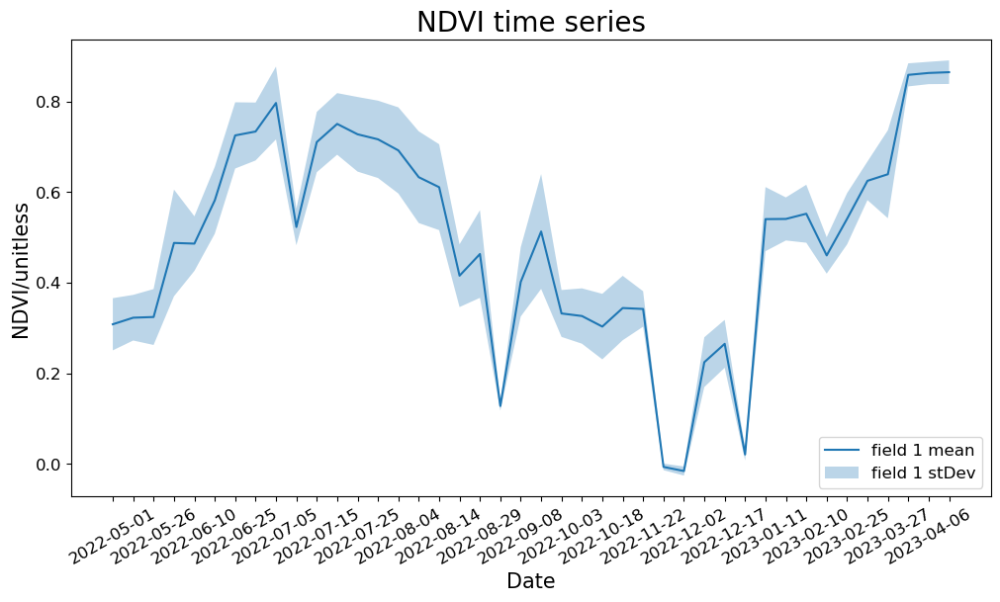

In [31]:
fig_stat, ax_stat =  plt.subplots(1, 1, figsize=(12,6))
t1 = result_df1['date']
ndvi_mean_field1 = result_df1['index_mean']
ndvi_std_field1 = result_df1['index_stDev']
ax_stat.plot(t1, ndvi_mean_field1, label='field 1 mean')
ax_stat.fill_between(t1, ndvi_mean_field1 - ndvi_std_field1, ndvi_mean_field1 + ndvi_std_field1, alpha=0.3, label='field 1 stDev')
ax_stat.tick_params(axis='x', labelrotation=30, labelsize=12)
ax_stat.tick_params(axis='y', labelsize=12)
ax_stat.set_xlabel('Date', size=15)
ax_stat.set_ylabel('NDVI/unitless', size=15)
ax_stat.legend(loc='lower right', prop={'size': 12})
ax_stat.set_title('NDVI time series', fontsize=20)
for label in ax_stat.get_xticklabels()[1::2]:
    label.set_visible(False)

### Comparing different fields

Now that we have learnt how to plot the data for the first field, let's take this another step forward and compare the NDVI time series of the first field with the second field. We will now run the same request for our second field and then transform the response into a second Pandas dataframe. In addition, to making multiple requests, we will also use the Planet Fusion dataset to generate our NDVI time series statistics. 

In [32]:
aggregation=SentinelHubStatistical.aggregation(
        evalscript=evalscript,
        time_interval=('2022-05-01T00:00:00Z', '2023-04-29T23:59:59Z'),
        aggregation_interval='P5D',
        size=[2500,1751],        
    )

input_data = SentinelHubStatistical.input_data(DataCollection.define_byoc('28eef896-9632-4546-a99e-cea34d74b21e'))

ndvi_requests = []

for geo_shape in fields_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS(fields_gdf.crs)),
        config=config,
    )
    ndvi_requests.append(request)

c:\Users\username\AppData\Local\anaconda3\envs\sentinel-hub\Lib\site-packages\sentinelhub\constants.py:114: SHUserWarning: sentinelhub-py supports only WGS 84 coordinate reference system with coordinate order lng-lat. Given pyproj.CRS(4326) has coordinate order lat-lng. Be careful to use the correct order of coordinates.
  warnings.warn(message, category=SHUserWarning)


In [33]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

CPU times: total: 78.1 ms
Wall time: 1min 42s


7

In [34]:
ndvi_dfs = [stats_to_df(polygon_stats) for polygon_stats in ndvi_stats]

for df, id in zip(ndvi_dfs, fields_gdf["id"].values):
    df["id"] = id

ndvi_df = pd.concat(ndvi_dfs)

ndvi_df

,interval_from,interval_to,index_B0_min,index_B0_max,index_B0_mean,index_B0_stDev,index_B0_sampleCount,index_B0_noDataCount,id
0,2022-05-01,2022-05-06,0.662760,0.889956,0.851458,0.021399,4377500,1699832,1
1,2022-05-06,2022-05-11,0.571937,0.877608,0.832938,0.024808,4377500,1699832,1
2,2022-05-26,2022-05-31,0.622289,0.870425,0.820255,0.037786,4377500,1699832,1
3,2022-06-05,2022-06-10,0.583969,0.813427,0.770418,0.037116,4377500,1699832,1
4,2022-06-10,2022-06-15,0.562584,0.726062,0.673896,0.028430,4377500,1699832,1
...,...,...,...,...,...,...,...,...,...
41,2023-03-27,2023-04-01,0.439956,0.848807,0.783120,0.046094,4377500,2596207,7
42,2023-04-01,2023-04-06,0.589619,0.920482,0.876905,0.024380,4377500,2398538,7
43,2023-04-06,2023-04-11,0.574478,0.926606,0.881690,0.029426,4377500,2398538,7
44,2023-04-16,2023-04-21,0.582054,0.917988,0.880393,0.031905,4377500,2398538,7


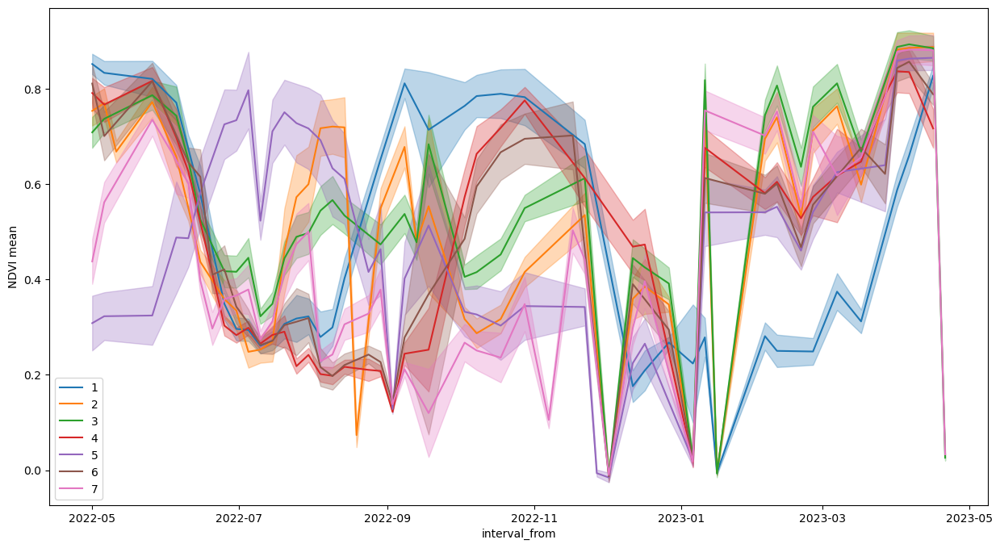

In [35]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.set_ylabel("NDVI mean")

for idx, id in enumerate(fields_gdf["id"].values):
    series = ndvi_df[ndvi_df["id"] == id]

    series.plot(ax=ax, x="interval_from", y="index_B0_mean", color=f"C{idx}", label=id)

    ax.fill_between(
        series.interval_from.values,
        series["index_B0_mean"] - series["index_B0_stDev"],
        series["index_B0_mean"] + series["index_B0_stDev"],
        color=f"C{idx}",
        alpha=0.3,
    );

## Summary

So what have we learnt in this notebook?

- Search and discover data using Catalog API
- How to quickly access satellite imagery though Sentinel Hub using Process API.
- Visualising NDVI derived from the satellite imagery 
- Using Statistical API to produce NDVI time series for single and multiple fields.

This concludes this notebook on working with Sentinel Hub APIs to access satellite imagery. For more information you can check out the [Sentinel Hub API](https://docs.sentinel-hub.com/api/latest/) Documentation and the [Sentinel Hub Python package](https://sentinelhub-py.readthedocs.io/en/latest/index.html) documentation too.

## What to look at next?

- There are more Tutorials for Sentinel Hub Python Package users [here](https://sentinelhub-py.readthedocs.io/en/latest/sh.html)
- If you are interested in machine learning, check out [EO-Learn](https://eo-learn.readthedocs.io/en/latest/index.html)
- You can find some cool use cases utilising Sentinel Hub APIs [here](https://github.com/eu-cdse/notebook-samples/tree/main/sentinelhub)